Install Necessary Libraries

In [1]:
!pip install torch torchvision tensorboard

Import Libraries

In [2]:
# Import necessary libraries
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision
import torchvision.transforms as transforms
from torch.utils.data import DataLoader
from torch.utils.tensorboard import SummaryWriter
import matplotlib.pyplot as plt
import numpy as np

Load CIFAR-100 Dataset

100%|██████████| 169001437/169001437 [00:18<00:00, 9098969.55it/s]


Extracting ./data/cifar-100-python.tar.gz to ./data
Files already downloaded and verified


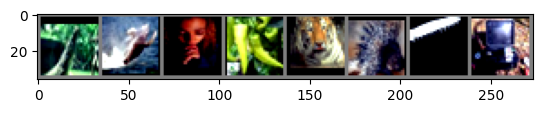

In [3]:
# Define data transformations
transform = transforms.Compose([
    transforms.RandomHorizontalFlip(),
    transforms.RandomCrop(32, padding=4),
    transforms.ToTensor(),
    transforms.Normalize((0.5071, 0.4865, 0.4409), (0.2673, 0.2564, 0.2762))  # CIFAR-100 normalization values
])

# Load CIFAR-100 dataset
batch_size = 64
train_dataset = torchvision.datasets.CIFAR100(root='./data', train=True, download=True, transform=transform)
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)

test_dataset = torchvision.datasets.CIFAR100(root='./data', train=False, download=True, transform=transform)
test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

# Define a function to visualize some samples from the dataset
def imshow(img):
    img = img / 2 + 0.5  # unnormalize
    npimg = img.numpy()
    plt.imshow(np.transpose(npimg, (1, 2, 0)))
    plt.show()

# Show some random training images
dataiter = iter(train_loader)
images, labels = next(dataiter)
imshow(torchvision.utils.make_grid(images[:8]))  # Show 8 images in a grid

Define the Model

In [18]:
# Load the pre-defined ResNet18 model and adjust it for CIFAR-100
from torchvision.models import resnet18

# Define the model
model = resnet18(pretrained=True)  # Set num_classes to 100 for CIFAR-100
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model = model.to(device)

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/resnet18-f37072fd.pth" to /root/.cache/torch/hub/checkpoints/resnet18-f37072fd.pth
100%|██████████| 44.7M/44.7M [00:00<00:00, 193MB/s]


In [24]:
model.fc = nn.Linear(model.fc.in_features, 100)
model = model.to(device)

Model Parameters

In [25]:
# prompt: print model parameters
print("Model Parameters:")
for name, param in model.named_parameters():
  print(f"Name: {name}, Shape: {param.shape}")


Model Parameters:
Name: conv1.weight, Shape: torch.Size([64, 3, 7, 7])
Name: bn1.weight, Shape: torch.Size([64])
Name: bn1.bias, Shape: torch.Size([64])
Name: layer1.0.conv1.weight, Shape: torch.Size([64, 64, 3, 3])
Name: layer1.0.bn1.weight, Shape: torch.Size([64])
Name: layer1.0.bn1.bias, Shape: torch.Size([64])
Name: layer1.0.conv2.weight, Shape: torch.Size([64, 64, 3, 3])
Name: layer1.0.bn2.weight, Shape: torch.Size([64])
Name: layer1.0.bn2.bias, Shape: torch.Size([64])
Name: layer1.1.conv1.weight, Shape: torch.Size([64, 64, 3, 3])
Name: layer1.1.bn1.weight, Shape: torch.Size([64])
Name: layer1.1.bn1.bias, Shape: torch.Size([64])
Name: layer1.1.conv2.weight, Shape: torch.Size([64, 64, 3, 3])
Name: layer1.1.bn2.weight, Shape: torch.Size([64])
Name: layer1.1.bn2.bias, Shape: torch.Size([64])
Name: layer2.0.conv1.weight, Shape: torch.Size([128, 64, 3, 3])
Name: layer2.0.bn1.weight, Shape: torch.Size([128])
Name: layer2.0.bn1.bias, Shape: torch.Size([128])
Name: layer2.0.conv2.weight, 

Define Loss Function, Optimizer, and TensorBoard Writer

In [26]:
# Define loss function and optimizer
criterion = nn.CrossEntropyLoss()
# optimizer = optim.Adam(model.fc.parameters(), lr=0.1)
optimizer = optim.SGD(model.parameters(), lr=0.01, weight_decay=5e-4)

# Initialize TensorBoard writer
writer = SummaryWriter('runs/cifar100_resnet18')

In [31]:
class AverageMetric:
    """Computes and stores the average and current value of a metric."""
    def __init__(self):
        self.reset()

    def reset(self):
        """Resets the metrics."""
        self.value = 0
        self.avg = 0
        self.sum = 0
        self.count = 0

    def update(self, val, n=1):
        """Updates the metrics with a new value."""
        self.value = val
        self.sum += val * n
        self.count += n
        self.avg = self.sum / self.count

In [34]:
# Function to save a checkpoint in the TensorBoard log directory
def save_checkpoint(model, optimizer, epoch, loss_metric, accuracy_metric, checkpoint_dir='runs/cifar100_resnet18'):
    checkpoint_path = f"{checkpoint_dir}/checkpoint_epoch_{epoch+1}.pth"
    checkpoint = {
        'model_state_dict': model.state_dict(),
        'optimizer_state_dict': optimizer.state_dict(),
        'epoch': epoch,
        'loss': loss_metric.avg,
        'accuracy': accuracy_metric.avg
    }
    torch.save(checkpoint, checkpoint_path)
    print(f'Checkpoint saved at {checkpoint_path}')

# Function to load a checkpoint from the TensorBoard log directory
def load_checkpoint(model, optimizer, checkpoint_dir='runs/cifar100_resnet18'):
    import glob
    # Find the latest checkpoint (e.g., based on the highest epoch number)
    checkpoint_paths = glob.glob(f"{checkpoint_dir}/checkpoint_epoch_*.pth")
    checkpoint_paths.sort(key=lambda x: int(x.split('_')[-1].split('.')[0]))
    latest_checkpoint = checkpoint_paths[-1]

    checkpoint = torch.load(latest_checkpoint)
    model.load_state_dict(checkpoint['model_state_dict'])
    optimizer.load_state_dict(checkpoint['optimizer_state_dict'])
    start_epoch = checkpoint['epoch'] + 1  # Resume from the next epoch
    loss = checkpoint['loss']
    accuracy = checkpoint['accuracy']
    print(f'Checkpoint loaded from {latest_checkpoint}. Resuming training from epoch {start_epoch}')
    return start_epoch, loss, accuracy

Train the Model (Log Metrics for Last Few Iterations)

In [35]:
# Updated training function with resuming capability and saving in TensorBoard log directory
def train_model(model, train_loader, criterion, optimizer, num_epochs=1, start_epoch=0, resume=False, checkpoint_dir='runs/cifar100_resnet18'):
    # Initialize the metrics
    loss_metric = AverageMetric()
    accuracy_metric = AverageMetric()

    # Load checkpoint if resuming
    if resume:
        start_epoch, loss, accuracy = load_checkpoint(model, optimizer, checkpoint_dir)
        loss_metric.avg = loss
        accuracy_metric.avg = accuracy

    model.train()
    for epoch in range(start_epoch, num_epochs):
        loss_metric.reset()
        accuracy_metric.reset()

        for i, (inputs, labels) in enumerate(train_loader):
            inputs, labels = inputs.to(device), labels.to(device)
            optimizer.zero_grad()
            outputs = model(inputs)
            loss = criterion(outputs, labels)
            loss.backward()
            optimizer.step()

            # Update loss and accuracy metrics
            loss_metric.update(loss.item(), inputs.size(0))
            _, predicted = torch.max(outputs.data, 1)
            correct = (predicted == labels).sum().item()
            accuracy_metric.update(correct / inputs.size(0), inputs.size(0))

            # Log every 100 mini-batches
            if (i + 1) % 100 == 0:
                print(f'Epoch [{epoch+1}/{num_epochs}], Step [{i+1}/{len(train_loader)}], '
                      f'Loss: {loss_metric.avg:.4f}, Accuracy: {accuracy_metric.avg * 100:.2f}%')

                # Log to TensorBoard
                writer.add_scalar('training_loss', loss_metric.avg, epoch * len(train_loader) + i)
                writer.add_scalar('training_accuracy', accuracy_metric.avg * 100, epoch * len(train_loader) + i)

        # Save checkpoint after each epoch in the specified directory
        save_checkpoint(model, optimizer, epoch, loss_metric, accuracy_metric, checkpoint_dir)

In [73]:
def evaluate_model(model, test_loader, criterion, optimizer, checkpoint_dir='runs/cifar100_resnet18'):
    # Load the model from the latest checkpoint if needed
    load_checkpoint(model, optimizer, checkpoint_dir)

    # Set the model to evaluation mode
    model.eval()

    loss_metric = AverageMetric()
    accuracy_metric = AverageMetric()

    with torch.no_grad():
        for inputs, labels in test_loader:
            inputs, labels = inputs.to(device), labels.to(device)
            outputs = model(inputs)
            loss = criterion(outputs, labels)

            # Update metrics
            loss_metric.update(loss.item(), inputs.size(0))
            _, predicted = torch.max(outputs.data, 1)
            correct = (predicted == labels).sum().item()
            accuracy_metric.update(correct / inputs.size(0), inputs.size(0))

    # Print the final averaged metrics
    print(f'Test Loss: {loss_metric.avg:.4f}, Test Accuracy: {accuracy_metric.avg * 100:.2f}%')

    # Log the final evaluation metrics to TensorBoard
    writer.add_scalar('test_loss', loss_metric.avg)
    writer.add_scalar('test_accuracy', accuracy_metric.avg * 100)

    # Return metrics for further use if needed
    return loss_metric.avg, accuracy_metric.avg * 100

In [77]:
def visualize_feature_maps(model, layer_name, image):
    # Get the specified layer's output
    activation = {}
    def hook_fn(module, input, output):
        activation[layer_name] = output

    layer = dict(model.named_modules())[layer_name]
    layer.register_forward_hook(hook_fn)

    # Pass the image through the model
    image = image.unsqueeze(0).to(device)  # Add batch dimension and move to device
    model(image)

    # Extract and plot the feature maps
    feature_maps = activation[layer_name].squeeze().cpu().detach()
    fig, axes = plt.subplots(1, min(8, feature_maps.size(0)), figsize=(15, 15))
    for i in range(min(8, feature_maps.size(0))):
        axes[i].imshow(feature_maps[i], cmap='viridis')
        axes[i].axis('off')
    plt.show()

In [90]:
import numpy as np
from sklearn.manifold import TSNE
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

def visualize_tsne(model, loader):
    features = []
    labels = []
    model.eval()

    with torch.no_grad():
        for inputs, targets in loader:
            inputs = inputs.to(device)
            output = model(inputs)
            features.extend(output.cpu().numpy())
            labels.extend(targets.numpy())

    # Convert the list of features into a numpy array
    features = np.array(features)
    labels = np.array(labels)

    # Perform t-SNE
    tsne = TSNE(n_components=2, random_state=42)
    tsne_results = tsne.fit_transform(features)

    # Create a DataFrame for visualization
    df = pd.DataFrame({'x': tsne_results[:, 0], 'y': tsne_results[:, 1], 'label': labels})

    # Plot the t-SNE results using seaborn
    plt.figure(figsize=(10, 8))
    sns.scatterplot(x='x', y='y', hue='label', palette='tab10', data=df, legend='full', alpha=0.7)
    plt.title('t-SNE of MobileNetV2 Features')
    plt.show()

In [99]:
def get_incorrect_predictions(model, loader, max_samples=10):
    model.eval()
    incorrect_samples = []
    incorrect_labels = []
    incorrect_preds = []

    with torch.no_grad():
        for inputs, labels in loader:
            inputs, labels = inputs.to(device), labels.to(device)
            outputs = model(inputs)
            _, preds = torch.max(outputs, 1)

            # Find indices where predictions do not match the true labels
            incorrect_indices = (preds != labels).nonzero(as_tuple=True)[0]

            for idx in incorrect_indices:
                if len(incorrect_samples) < max_samples:
                    incorrect_samples.append(inputs[idx].cpu())
                    incorrect_labels.append(labels[idx].cpu().item())
                    incorrect_preds.append(preds[idx].cpu().item())
                else:
                    return incorrect_samples, incorrect_labels, incorrect_preds

    return incorrect_samples, incorrect_labels, incorrect_preds


def visualize_incorrect_predictions(model, loader, class_names, max_samples=10):
    incorrect_samples, incorrect_labels, incorrect_preds = get_incorrect_predictions(model, loader, max_samples=max_samples)

    # Plot the images with true and predicted labels
    fig, axes = plt.subplots(1, len(incorrect_samples), figsize=(15, 5))
    if len(incorrect_samples) == 1:
        axes = [axes]  # To handle the case where there's only one incorrect sample

    for idx, (img, true_label, pred_label) in enumerate(zip(incorrect_samples, incorrect_labels, incorrect_preds)):
        img = img.permute(1, 2, 0)  # Convert from (C, H, W) to (H, W, C)
        img = img * 0.2673 + 0.5071  # Unnormalize for CIFAR100: (std_dev * image + mean)
        img = np.clip(img, 0, 1)

        axes[idx].imshow(img)
        axes[idx].set_title(f'True: {class_names[true_label]}\nPred: {class_names[pred_label]}', fontsize=10)
        axes[idx].axis('off')

    plt.tight_layout()
    plt.show()

In [36]:
# Start training from scratch
train_model(model, train_loader, criterion, optimizer, num_epochs=10, resume=False, checkpoint_dir='runs/cifar100_resnet18')

# If training gets interrupted, resume from the last checkpoint:
train_model(model, train_loader, criterion, optimizer, num_epochs=10, resume=True, checkpoint_dir='runs/cifar100_resnet18')

Epoch [1/10], Step [100/782], Loss: 1.1307, Accuracy: 67.28%
Epoch [1/10], Step [200/782], Loss: 1.1176, Accuracy: 67.39%


KeyboardInterrupt: 

In [70]:
# Load the TensorBoard extension
%load_ext tensorboard

# Start TensorBoard and point it to the log directory used by SummaryWriter
%tensorboard --logdir=runs

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


<IPython.core.display.Javascript object>

In [30]:
# Function to log some images with predictions
def log_images_with_predictions(model, loader, writer, num_images=10):
    model.eval()
    dataiter = iter(loader)
    images, labels = next(dataiter)
    images, labels = images.to(device), labels.to(device)
    outputs = model(images)
    _, preds = torch.max(outputs, 1)

    # Log a batch of images along with their predictions
    img_grid = torchvision.utils.make_grid(images[:num_images])
    writer.add_image('cifar100_images', img_grid)

    # Print out the ground truth and predicted labels for reference
    print('Ground Truth:', labels[:num_images].cpu().numpy())
    print('Predicted:', preds[:num_images].cpu().numpy())

# Call the function to log images
log_images_with_predictions(model, test_loader, writer, 100)

Ground Truth: [49 33 72 51 71 92 15 14 23  0 71 75 81 69 40 43 92 97 70 53 70 49 75 29
 21 16 39  8  8 70 20 61 41 93 56 73 58 11 25 37 63 24 49 73 56 22 41 58
 75 17  4  6  9 57  2 32 71 52 42 69 77 27 15 65]
Predicted: [49 80 27 51 71 79 80 14 71  0 12 72 58 69 40 43 92 97 70 53 70 49 75 56
 21 16 39  8  8 35 20 61 41 73 56 44 45 35 25 81 63 72 95 30 56 22 41  9
 19 17 98  6  9 57  2 32 71 52 42 69 78 91 31 33]


Other Models

In [64]:
# Load the pre-defined ResNet18 model and adjust it for CIFAR-100
from torchvision.models import mobilenet_v2

# Define the model
model2 = mobilenet_v2(pretrained=True)
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model2 = model2.to(device)
optimizer2 = optim.SGD(model2.parameters(), lr=0.01, weight_decay=5e-4)

In [56]:
print("Model Parameters:")
for name, param in model2.named_parameters():
  print(f"Name: {name}, Shape: {param.shape}")

Model Parameters:
Name: features.0.0.weight, Shape: torch.Size([32, 3, 3, 3])
Name: features.0.1.weight, Shape: torch.Size([32])
Name: features.0.1.bias, Shape: torch.Size([32])
Name: features.1.conv.0.0.weight, Shape: torch.Size([32, 1, 3, 3])
Name: features.1.conv.0.1.weight, Shape: torch.Size([32])
Name: features.1.conv.0.1.bias, Shape: torch.Size([32])
Name: features.1.conv.1.weight, Shape: torch.Size([16, 32, 1, 1])
Name: features.1.conv.2.weight, Shape: torch.Size([16])
Name: features.1.conv.2.bias, Shape: torch.Size([16])
Name: features.2.conv.0.0.weight, Shape: torch.Size([96, 16, 1, 1])
Name: features.2.conv.0.1.weight, Shape: torch.Size([96])
Name: features.2.conv.0.1.bias, Shape: torch.Size([96])
Name: features.2.conv.1.0.weight, Shape: torch.Size([96, 1, 3, 3])
Name: features.2.conv.1.1.weight, Shape: torch.Size([96])
Name: features.2.conv.1.1.bias, Shape: torch.Size([96])
Name: features.2.conv.2.weight, Shape: torch.Size([24, 96, 1, 1])
Name: features.2.conv.3.weight, Shap

In [65]:
model2.classifier

Sequential(
  (0): Dropout(p=0.2, inplace=False)
  (1): Linear(in_features=1280, out_features=1000, bias=True)
)

In [68]:
model2.classifier[1] = nn.Linear(model2.classifier[1].in_features, 100)
model2 = model2.to(device)
writer = SummaryWriter('runs/cifar100_mobilenet_v2')

In [69]:
# Start training from scratch
train_model(model2, train_loader, criterion, optimizer2, num_epochs=10, resume=False, checkpoint_dir='runs/cifar100_mobilenet_v2')

# If training gets interrupted, resume from the last checkpoint:
train_model(model2, train_loader, criterion, optimizer2, num_epochs=10, resume=True, checkpoint_dir='runs/cifar100_mobilenet_v2')

Epoch [1/10], Step [100/782], Loss: 4.2436, Accuracy: 8.16%
Epoch [1/10], Step [200/782], Loss: 3.9742, Accuracy: 12.39%
Epoch [1/10], Step [300/782], Loss: 3.8079, Accuracy: 14.80%
Epoch [1/10], Step [400/782], Loss: 3.6756, Accuracy: 17.02%
Epoch [1/10], Step [500/782], Loss: 3.5840, Accuracy: 18.47%
Epoch [1/10], Step [600/782], Loss: 3.5039, Accuracy: 19.78%
Epoch [1/10], Step [700/782], Loss: 3.4323, Accuracy: 21.01%
Checkpoint saved at runs/cifar100_mobilenet_v2/checkpoint_epoch_1.pth
Epoch [2/10], Step [100/782], Loss: 2.8688, Accuracy: 30.81%
Epoch [2/10], Step [200/782], Loss: 2.8418, Accuracy: 31.58%
Epoch [2/10], Step [300/782], Loss: 2.8156, Accuracy: 31.73%
Epoch [2/10], Step [400/782], Loss: 2.8022, Accuracy: 31.96%
Epoch [2/10], Step [500/782], Loss: 2.7865, Accuracy: 32.15%
Epoch [2/10], Step [600/782], Loss: 2.7698, Accuracy: 32.62%
Epoch [2/10], Step [700/782], Loss: 2.7569, Accuracy: 32.79%
Checkpoint saved at runs/cifar100_mobilenet_v2/checkpoint_epoch_2.pth
Epoch [

<ipython-input-34-38588889c2fa>:22: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  checkpoint = torch.load(latest_checkpoint)


In [75]:
evaluate_model(model, test_loader, criterion, optimizer, checkpoint_dir='runs/cifar100_resnet18')

<ipython-input-34-38588889c2fa>:22: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  checkpoint = torch.load(latest_checkpoint)


Checkpoint loaded from runs/cifar100_resnet18/checkpoint_epoch_3.pth. Resuming training from epoch 3
Test Loss: 15.6206, Test Accuracy: 0.14%


(15.620643774414063, 0.13999999999999999)

In [74]:
evaluate_model(model2, test_loader, criterion, optimizer2, checkpoint_dir='runs/cifar100_mobilenet_v2')

<ipython-input-34-38588889c2fa>:22: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  checkpoint = torch.load(latest_checkpoint)


Checkpoint loaded from runs/cifar100_mobilenet_v2/checkpoint_epoch_10.pth. Resuming training from epoch 10
Test Loss: 1.8618, Test Accuracy: 51.16%


(1.8618246229171753, 51.160000000000004)

In [ ]:
# Visualize feature maps for an input image and a specific layer (e.g., 'features.2' in MobileNetV2)
dataiter = iter(test_loader)
images, _ = next(dataiter)
imshow(torchvision.utils.make_grid(images[0]))
visualize_feature_maps(model2, 'features.0', images[0])

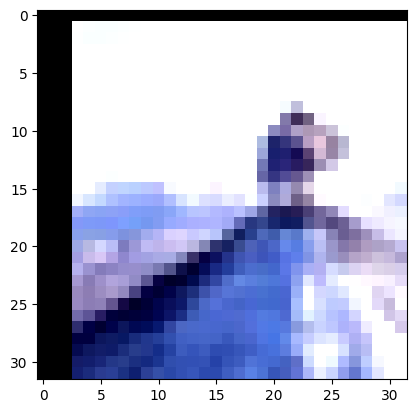

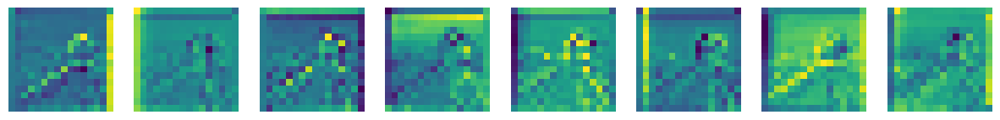

In [81]:
# Visualize feature maps for an input image and a specific layer (e.g., 'features.2' in MobileNetV2)
dataiter = iter(test_loader)
images, _ = next(dataiter)
imshow(torchvision.utils.make_grid(images[0]))
visualize_feature_maps(model2, 'features.1', images[0])

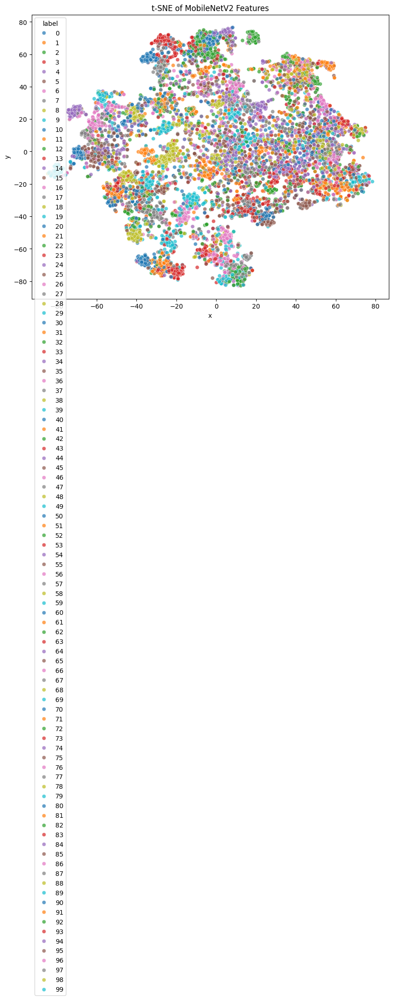

In [91]:
visualize_tsne(model2, test_loader)

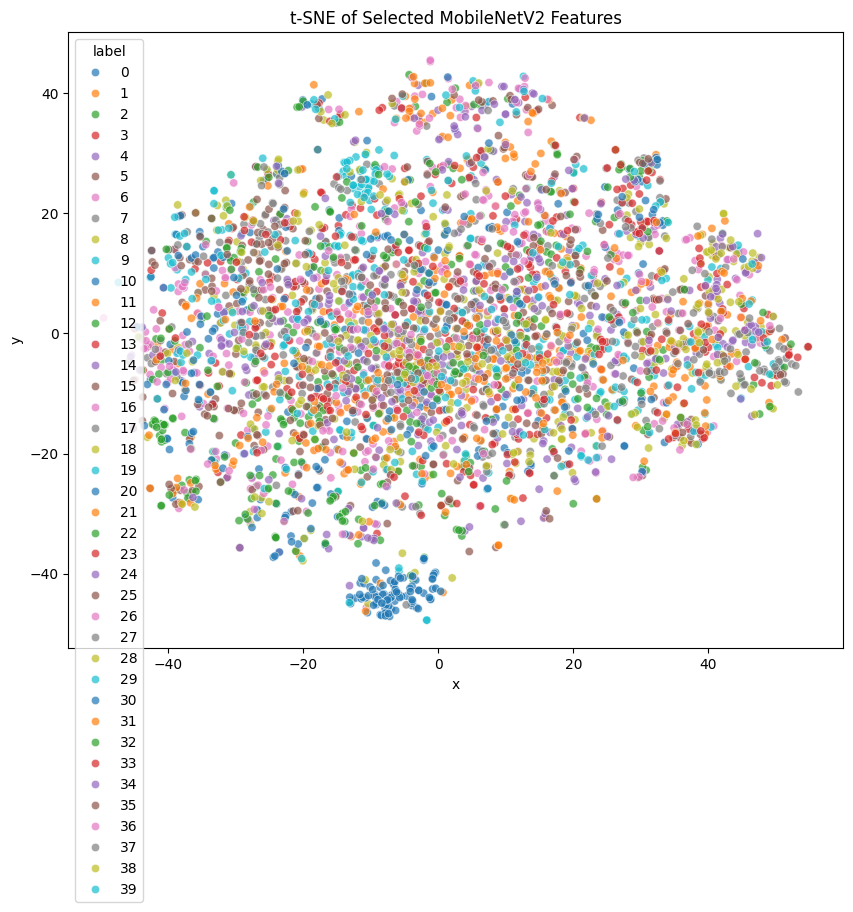

In [96]:
# Define a subset of classes to visualize (e.g., 10 classes)
selected_labels = list(range(40))  # Change this to any subset of class indices

# Visualize the t-SNE with the selected subset
visualize_tsne_subset(model, test_loader, selected_labels)

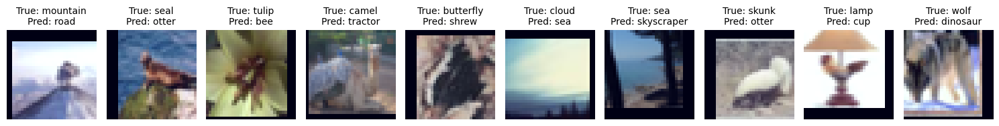

In [101]:
# Get class names (for CIFAR-100)
class_names = train_dataset.classes

# Visualize incorrectly predicted samples
visualize_incorrect_predictions(model2, test_loader, class_names, max_samples=10)